In [1]:
from pathlib import Path

import pandas as pd
import numpy as np
import datetime as dt

import plotly.express as px
import plotly.io as pio
import matplotlib.pyplot as plt
import seaborn as sns

from ray import tune
from ray.air import session
from ray.train import Checkpoint

from recsys4daos.utils.notebooks import download_plotly, download_matplotlib
import paths

pio.templates.default = 'seaborn'
sns.set_theme()

In [2]:
SPLITS_FREQ = 'W-THU'
SPLITS_NORMALIZE = True # Wether or not to move everything to 00:00
CUTOFF_DATE = dt.datetime.fromisoformat("2023-07-29")
RAY_RESULTS_PATH = '~/ray_results3.11'
ORG_NAME = 'Decentraland'
LAST_FOLDS = 10 # Used for asserts
LAST_FOLD_DATE_STR: str = '2023-07-13'

OPTIM_METRIC = 'map@10'
OPTIM_MODE = 'max'

SAMPLES_PER_SPLIT: int = 100 # See 07_microsoft_tuning.ipynb

In [3]:
# Parameters
EXECUTION_ID = "2024-09-04T10:00"
ORG_NAME = "Lido"
SPLITS_FREQ = "W-WED"
LAST_FOLDS = 10
SPLITS_NORMALIZE = True
LAST_FOLD_DATE_STR = "2022-07-06"


In [4]:
RAY_RESULTS_PATH = Path(RAY_RESULTS_PATH).expanduser()
assert RAY_RESULTS_PATH.is_dir()

## Get ray results

In [5]:
fname_glob = paths.lightgcn_ray_tune_fname(ORG_NAME, SPLITS_FREQ, SPLITS_NORMALIZE, OPTIM_METRIC, fold='glob')
fname_glob

'Lido/LightGCN_W-WED_normalize_map@10_fold=[0-9]*'

In [6]:
last_experiments = sorted(RAY_RESULTS_PATH.glob(fname_glob))
print(f"Found {len(last_experiments)} folds")

class TrainLightGCN:
    def __init__(self):
        raise NotImplementedError

tuners = [ tune.Tuner.restore(str(l), TrainLightGCN) for l in last_experiments ]
result_grids = [ tuner.get_results() for tuner in tuners ]
assert len(result_grids) == LAST_FOLDS, f"Waiting for full experiment to run {len(result_grids)}/{LAST_FOLDS}"

for i, rg in enumerate(result_grids):
    print(f"Fold: {i}, {rg.num_terminated} finished, {rg.num_errors} errors")
    assert rg.num_terminated == SAMPLES_PER_SPLIT
    assert rg.num_errors == 0, "There should be no errors"

Found 10 folds


Fold: 0, 100 finished, 0 errors
Fold: 1, 100 finished, 0 errors
Fold: 2, 100 finished, 0 errors
Fold: 3, 100 finished, 0 errors
Fold: 4, 100 finished, 0 errors
Fold: 5, 100 finished, 0 errors
Fold: 6, 100 finished, 0 errors
Fold: 7, 100 finished, 0 errors
Fold: 8, 100 finished, 0 errors
Fold: 9, 100 finished, 0 errors


In [7]:
# Checking data from just one experiment
pd.concat(result_grids[0]._experiment_analysis.trial_dataframes.values())

,real_batch_size,iteration,loss,mf_loss,emb_loss,model_recall,model_ndcg,model_precision,model_map,precision@1,...,node_ip,time_since_restore,iterations_since_restore,config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,config/fold
0,600,5,0.539276,0.539275,3.353507e-07,0.542857,0.542857,0.542857,0.542857,1.0,...,147.96.81.131,0.358601,1,10,8,4,0.0164,2.502810e-07,10YE,2022-05-04T00:00:00
1,600,10,0.278287,0.278286,1.207724e-06,0.542857,0.542857,0.542857,0.542857,1.0,...,147.96.81.131,0.534352,2,10,8,4,0.0164,2.502810e-07,10YE,2022-05-04T00:00:00
2,600,15,0.156932,0.156930,2.277670e-06,0.542857,0.542857,0.542857,0.542857,1.0,...,147.96.81.131,0.711217,3,10,8,4,0.0164,2.502810e-07,10YE,2022-05-04T00:00:00
3,600,20,0.120427,0.120424,3.085630e-06,0.542857,0.542857,0.542857,0.542857,1.0,...,147.96.81.131,0.890780,4,10,8,4,0.0164,2.502810e-07,10YE,2022-05-04T00:00:00
4,600,25,0.114586,0.114582,3.738829e-06,0.542857,0.542857,0.542857,0.542857,1.0,...,147.96.81.131,1.062529,5,10,8,4,0.0164,2.502810e-07,10YE,2022-05-04T00:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35,64,180,0.000696,0.000094,6.015879e-04,0.400000,0.400000,0.400000,0.400000,1.0,...,147.96.81.131,7.886550,36,6,12,1,0.0285,1.407137e-05,90d,2022-05-04T00:00:00
36,64,185,0.000729,0.000142,5.866717e-04,0.400000,0.400000,0.400000,0.400000,1.0,...,147.96.81.131,8.114645,37,6,12,1,0.0285,1.407137e-05,90d,2022-05-04T00:00:00
37,64,190,0.000774,0.000191,5.828710e-04,0.428571,0.428571,0.428571,0.428571,1.0,...,147.96.81.131,8.332855,38,6,12,1,0.0285,1.407137e-05,90d,2022-05-04T00:00:00
38,64,195,0.000673,0.000096,5.767223e-04,0.400000,0.400000,0.400000,0.400000,1.0,...,147.96.81.131,8.552564,39,6,12,1,0.0285,1.407137e-05,90d,2022-05-04T00:00:00


## Create dataframe with all results

In [8]:
# Read dataframe and drop some unneeded columns
# rdf = pd.concat([rg.get_dataframe(TARGET, 'max') for rg in result_grids ])
rdf = pd.concat([ pd.concat(rg._experiment_analysis.trial_dataframes.values()) for rg in result_grids ])

drop_cols = [
    'timestamp', 'node_ip', 'pid', 'hostname', 'time_since_restore', # 'checkpoint_dir_name', 'trial_id', # 'logdir'
    'model_recall', 'model_ndcg', 'model_precision', 'model_map', 
    'time_train', 'time_eval', 'time_total_s', 'time_this_iter_s',
    'training_iteration', 'iterations_since_restore',
    # 'recall@5', 'map@5', 'recall@10', 'map@10',
]
rdf = rdf.drop(columns=drop_cols)
rdf = rdf.drop(columns=['date']).rename(columns={'config/__trial_index__': 'config/fold', 'iteration':'config/iteration'})
rdf['config/fold'] = pd.to_datetime(rdf['config/fold'])
# rdf = rdf[rdf['done']]
print(rdf.columns)

for c in ['config/batch_size']: #, 'config/embedding_dim']:
    rdf[c] = 2**rdf[c]

# rdf[(rdf['config/fold'] >= 1) & (rdf['iteration'] > 10)].sort_values('precision@5').tail()
# Display some results
rdf.sort_values(OPTIM_METRIC).tail()

Index(['real_batch_size', 'config/iteration', 'loss', 'mf_loss', 'emb_loss',
       'precision@1', 'precision@3', 'precision@5', 'precision@10',
       'precision@15', 'precision@100', 'ndcg@1', 'ndcg@3', 'ndcg@5',
       'ndcg@10', 'ndcg@15', 'ndcg@100', 'map@1', 'map@3', 'map@5', 'map@10',
       'map@15', 'map@100', 'recall@1', 'recall@3', 'recall@5', 'recall@10',
       'recall@15', 'recall@100', 'r-precision@1', 'r-precision@3',
       'r-precision@5', 'r-precision@10', 'r-precision@15', 'r-precision@100',
       'time_rec', 'time_total_train', 'time_total_test', 'done', 'trial_id',
       'config/batch_size', 'config/embedding_dim', 'config/conv_layers',
       'config/learning_rate', 'config/l2', 'config/window_size',
       'config/fold'],
      dtype='object')


,real_batch_size,config/iteration,loss,mf_loss,emb_loss,precision@1,precision@3,precision@5,precision@10,precision@15,...,time_total_test,done,trial_id,config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,config/fold
11,256,60,0.030843,0.015866,1.497612e-02,1.0,0.333333,0.2,0.1,0.066667,...,1.539661,False,aa9ebd61,256,549,1,0.0384,3.130563e-05,90d,2022-05-18
12,256,65,0.017825,0.002432,1.539301e-02,1.0,0.333333,0.2,0.1,0.066667,...,1.670096,False,aa9ebd61,256,549,1,0.0384,3.130563e-05,90d,2022-05-18
13,256,70,0.044772,0.028585,1.618688e-02,1.0,0.333333,0.2,0.1,0.066667,...,1.797109,False,aa9ebd61,256,549,1,0.0384,3.130563e-05,90d,2022-05-18
23,64,120,19.769330,10.934644,8.834686e+00,1.0,0.333333,0.2,0.1,0.066667,...,3.154931,False,fefb40a2,64,931,2,0.4467,2.164149e-05,90d,2022-05-18
0,600,5,0.539276,0.539275,3.353507e-07,1.0,0.333333,0.2,0.1,0.066667,...,0.126738,False,699ef8b3,1024,8,4,0.0164,2.502810e-07,10YE,2022-05-04


### Define K_RECOMMENDATIONS

In [9]:
K_RECOMMENDATIONS = { int(c.split('@')[1]) for c in rdf.columns if '@' in c }
K_RECOMMENDATIONS

{1, 3, 5, 10, 15, 100}

## Assert that every experiment was completed

In [10]:
_config_cols = [ c for c in rdf.columns if c.startswith('config/') and c != 'config/iteration' ]

# _s = rdf.groupby(_config_cols).size().groupby('config/fold').size()
# print(_s)

# Cuidado, no es aleatorio sin reemplazamiento, por lo que
# alguna config, por casualidad, puede estar repetida y es necesario
# usar trial_id
_config_cols.append('trial_id')

_s = rdf.groupby(_config_cols).size().groupby('config/fold').size()
print(_s)
assert all(_s == SAMPLES_PER_SPLIT), "Insufficient number of samples" 

config/fold
2022-05-04    100
2022-05-11    100
2022-05-18    100
2022-05-25    100
2022-06-01    100
2022-06-08    100
2022-06-15    100
2022-06-22    100
2022-06-29    100
2022-07-06    100
dtype: int64


## Get total execution time

In [11]:
_config_cols = ['trial_id'] + [ c for c in rdf.columns if c.startswith('config/') and c != 'config/iteration' ]

last_iteration_time = rdf.groupby(_config_cols)['time_total_train'].max()
print(last_iteration_time)
print("Mean exec time: ", dt.timedelta(seconds=last_iteration_time.mean()))
print("Total exec time:", dt.timedelta(seconds=last_iteration_time.sum()))

trial_id  config/batch_size  config/embedding_dim  config/conv_layers  config/learning_rate  config/l2     config/window_size  config/fold
002961f1  1024               5                     3                   0.0008                5.982288e-04  21d                 2022-05-18      1.059259
0064636d  128                146                   4                   0.0025                4.755736e-03  10YE                2022-05-25     10.847179
00a79bdc  1024               126                   1                   0.2192                7.123887e-07  90d                 2022-06-08      2.338462
00cc6759  1024               382                   4                   0.1629                5.990898e-07  60d                 2022-06-22      1.826813
0119e409  128                46                    3                   0.0004                1.006277e-07  90d                 2022-06-15      7.064567
                                                                                                     

In [12]:
# Number of iterations
rdf.groupby('trial_id')['config/iteration'].max().describe()

count    1000.0
mean      200.0
std         0.0
min       200.0
25%       200.0
50%       200.0
75%       200.0
max       200.0
Name: config/iteration, dtype: float64

## Get baseline data

In [13]:
bdf = paths.load_openpop(ORG_NAME, SPLITS_FREQ, SPLITS_NORMALIZE)
bdf = bdf[bdf.index <= CUTOFF_DATE][-LAST_FOLDS:]
bdf.mean()

precision@1        0.497468
precision@3        0.320609
precision@5        0.213590
precision@10       0.106795
precision@15       0.071197
precision@100      0.010679
ndcg@1             0.497468
ndcg@3             0.533587
ndcg@5             0.552724
ndcg@10            0.552724
ndcg@15            0.552724
ndcg@100           0.552724
map@1              0.497468
map@3              0.520460
map@5              0.535189
map@10             0.535189
map@15             0.535189
map@100            0.535189
recall@1           0.339441
recall@3           0.547558
recall@5           0.600000
recall@10          0.600000
recall@15          0.600000
recall@100         0.600000
r-precision@1      0.402299
r-precision@3      0.565650
r-precision@5      0.580896
r-precision@10     0.580896
r-precision@15     0.580896
r-precision@100    0.580896
time_eval          0.116181
dtype: float64

In [14]:
bdf

,precision@1,precision@3,precision@5,precision@10,precision@15,precision@100,ndcg@1,ndcg@3,ndcg@5,ndcg@10,...,recall@10,recall@15,recall@100,r-precision@1,r-precision@3,r-precision@5,r-precision@10,r-precision@15,r-precision@100,time_eval
fold,,,,,,,,,,,,,,,,,,,,,
2023-04-26,0.934109,0.572351,0.343411,0.171705,0.114470,0.017171,0.934109,0.975681,0.975681,0.975681,...,1.0,1.0,1.0,0.616183,1.000000,1.000000,1.000000,1.000000,1.000000,0.154398
2023-05-03,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.069176
2023-05-10,0.719212,0.623974,0.524138,0.262069,0.174713,0.026207,0.719212,0.735321,0.851931,0.851931,...,1.0,1.0,1.0,0.387557,0.750534,0.867521,0.867521,0.867521,0.867521,0.158622
2023-05-17,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.069967
2023-05-24,0.724382,0.339223,0.203534,0.101767,0.067845,0.010177,0.724382,0.898277,0.898277,0.898277,...,1.0,1.0,1.0,0.987805,1.000000,1.000000,1.000000,1.000000,1.000000,0.155763
2023-05-31,0.757895,0.624561,0.432632,0.216316,0.144211,0.021632,0.757895,0.799728,0.874486,0.874486,...,1.0,1.0,1.0,0.504051,0.926239,0.954955,0.954955,0.954955,0.954955,0.154062
2023-06-07,1.000000,0.333333,0.200000,0.100000,0.066667,0.010000,1.000000,1.000000,1.000000,1.000000,...,1.0,1.0,1.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.122659
2023-06-14,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.069231
2023-06-21,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.070196


(0.0, 1.0)

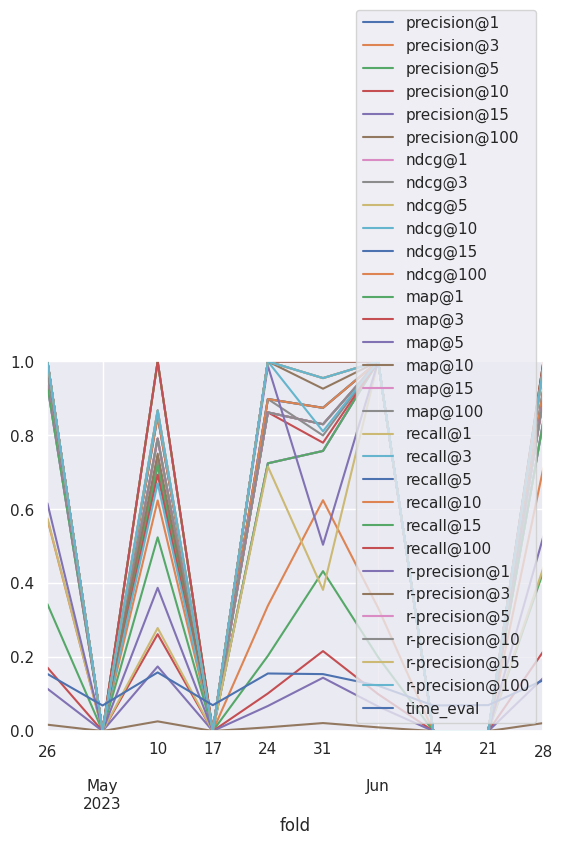

In [15]:
ax = bdf.plot()
ax.set_ylim(0, 1)

### Get perfect data

In [16]:
pdf = paths.load_perfect(ORG_NAME, SPLITS_FREQ, SPLITS_NORMALIZE)
pdf = pdf[pdf.index <= CUTOFF_DATE][-LAST_FOLDS:]
pdf.mean()

precision@1        0.600000
precision@3        0.340247
precision@5        0.213590
precision@10       0.106795
precision@15       0.071197
precision@100      0.010679
ndcg@1             0.600000
ndcg@3             0.600000
ndcg@5             0.600000
ndcg@10            0.600000
ndcg@15            0.600000
ndcg@100           0.600000
map@1              0.600000
map@3              0.600000
map@5              0.600000
map@10             0.600000
map@15             0.600000
map@100            0.600000
recall@1           0.437555
recall@3           0.588198
recall@5           0.600000
recall@10          0.600000
recall@15          0.600000
recall@100         0.600000
r-precision@1      0.437555
r-precision@3      0.588198
r-precision@5      0.600000
r-precision@10     0.600000
r-precision@15     0.600000
r-precision@100    0.600000
time_eval          0.122851
dtype: float64

In [17]:
pdf

,precision@1,precision@3,precision@5,precision@10,precision@15,precision@100,ndcg@1,ndcg@3,ndcg@5,ndcg@10,...,recall@10,recall@15,recall@100,r-precision@1,r-precision@3,r-precision@5,r-precision@10,r-precision@15,r-precision@100,time_eval
fold,,,,,,,,,,,,,,,,,,,,,
2023-04-26,1.0,0.572351,0.343411,0.171705,0.114470,0.017171,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,0.641473,1.000000,1.0,1.0,1.0,1.0,0.166966
2023-05-03,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.073515
2023-05-10,1.0,0.753695,0.524138,0.262069,0.174713,0.026207,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,0.531609,0.910099,1.0,1.0,1.0,1.0,0.168175
2023-05-17,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.074465
2023-05-24,1.0,0.339223,0.203534,0.101767,0.067845,0.010177,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,0.991166,1.000000,1.0,1.0,1.0,1.0,0.162033
2023-05-31,1.0,0.691228,0.432632,0.216316,0.144211,0.021632,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,0.613596,0.977632,1.0,1.0,1.0,1.0,0.160839
2023-06-07,1.0,0.333333,0.200000,0.100000,0.066667,0.010000,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.000000,1.000000,1.0,1.0,1.0,1.0,0.130522
2023-06-14,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.073626
2023-06-21,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.074910


(0.0, 1.0)

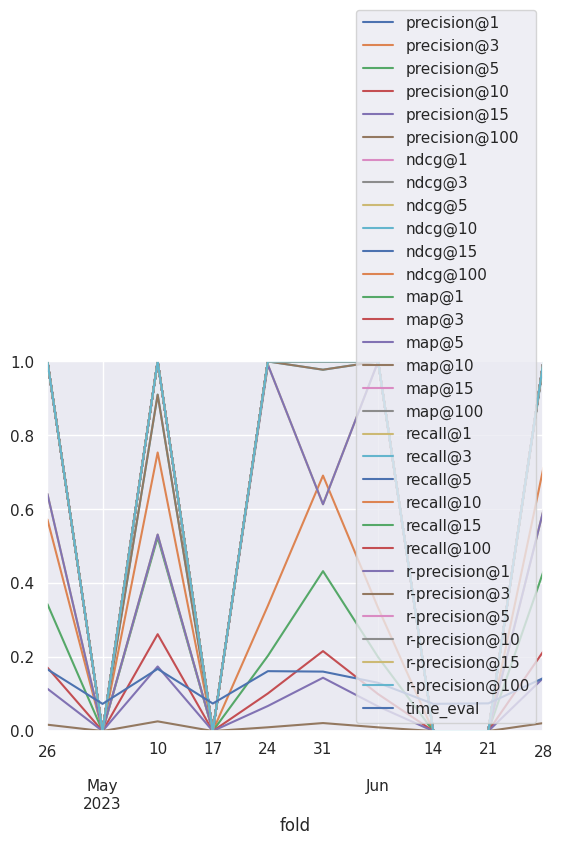

In [18]:
ax = pdf.plot()
ax.set_ylim(0, 1)

## Explore hparams

In [19]:
# Primero, obtenemos la mejor iteración, como si hubiesemos hecho early stopping
hdf = pd.concat(rg.get_dataframe(OPTIM_METRIC, OPTIM_MODE) for rg in result_grids)
print(hdf.columns)
hdf

Index(['real_batch_size', 'iteration', 'loss', 'mf_loss', 'emb_loss',
       'model_recall', 'model_ndcg', 'model_precision', 'model_map',
       'precision@1', 'precision@3', 'precision@5', 'precision@10',
       'precision@15', 'precision@100', 'ndcg@1', 'ndcg@3', 'ndcg@5',
       'ndcg@10', 'ndcg@15', 'ndcg@100', 'map@1', 'map@3', 'map@5', 'map@10',
       'map@15', 'map@100', 'recall@1', 'recall@3', 'recall@5', 'recall@10',
       'recall@15', 'recall@100', 'r-precision@1', 'r-precision@3',
       'r-precision@5', 'r-precision@10', 'r-precision@15', 'r-precision@100',
       'time_eval', 'time_train', 'time_rec', 'time_total_train',
       'time_total_test', 'done', 'training_iteration', 'trial_id', 'date',
       'timestamp', 'time_this_iter_s', 'time_total_s', 'pid', 'hostname',
       'node_ip', 'time_since_restore', 'iterations_since_restore',
       'config/batch_size', 'config/embedding_dim', 'config/conv_layers',
       'config/learning_rate', 'config/l2', 'config/window_siz

,real_batch_size,iteration,loss,mf_loss,emb_loss,model_recall,model_ndcg,model_precision,model_map,precision@1,...,time_since_restore,iterations_since_restore,config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,config/fold,logdir
0,600,5,0.539276,0.539275,3.353507e-07,0.542857,0.542857,0.542857,0.542857,1.000000,...,0.358601,1,10,8,4,0.0164,2.502810e-07,10YE,2022-05-04T00:00:00,699ef8b3
1,184,5,0.122506,0.016806,1.057000e-01,0.057143,0.057143,0.057143,0.057143,1.000000,...,0.350197,1,8,1008,1,0.0352,6.686929e-03,30d,2022-05-04T00:00:00,d89178a5
2,215,5,0.691258,0.691258,1.396212e-07,0.542857,0.542857,0.542857,0.542857,1.000000,...,0.357720,1,10,2,4,0.0024,6.785058e-07,60d,2022-05-04T00:00:00,8b65f1ea
3,215,5,0.688957,0.688957,8.483060e-08,0.542857,0.542857,0.542857,0.542857,1.000000,...,0.342672,1,10,2,3,0.0041,3.723235e-07,60d,2022-05-04T00:00:00,726a2847
4,256,5,0.143110,0.143096,1.484533e-05,0.542857,0.542857,0.542857,0.542857,1.000000,...,0.369498,1,8,32,4,0.0150,1.242024e-06,10YE,2022-05-04T00:00:00,a20d5f6d
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,256,55,0.001350,0.001332,1.754842e-05,0.043694,0.051351,0.051351,0.051351,0.781081,...,4.459915,11,8,45,2,0.0119,1.988804e-07,90d,2022-07-06T00:00:00,d06bd410
96,512,20,0.667184,0.666810,3.741066e-04,0.072072,0.100000,0.100000,0.100000,0.597297,...,1.000965,4,9,86,3,0.0002,1.667490e-04,30d,2022-07-06T00:00:00,1f73662a
97,512,200,0.044316,0.030081,1.423450e-02,0.260360,0.286486,0.286486,0.286486,0.608108,...,8.315796,40,9,86,2,0.0006,1.343254e-03,21d,2022-07-06T00:00:00,3153cfee
98,64,90,0.027778,0.027774,3.774255e-06,0.215315,0.235135,0.235135,0.235135,0.786486,...,58.755230,18,6,711,2,0.0001,1.419294e-07,10YE,2022-07-06T00:00:00,298a9dbc


In [20]:
# Force categorization
hdf['config/fold'] = hdf['config/fold'].astype(str)

fig = px.scatter(hdf, x='map@10', y='ndcg@10', color='config/fold')
fig.layout.update(showlegend=False)

download_plotly(fig, 'scatter_ndcg_map.pdf')
fig

In [21]:
fig = px.scatter(hdf, x='iteration', y='loss', color='config/fold', log_y=True)
fig.layout.update(showlegend=True)

download_plotly(fig, 'scatter_ndcg_map.pdf')
fig

In [22]:
fig = px.scatter(hdf, x='iteration', y=OPTIM_METRIC, color='config/fold', log_y=True)
fig.layout.update(showlegend=True)

download_plotly(fig, 'scatter_ndcg_map.pdf')
fig

In [23]:
fig = px.scatter(hdf, x='loss', y='ndcg@10', color='config/fold', log_x=True)
fig.layout.update(showlegend=True)

download_plotly(fig, 'scatter_ndcg_map.pdf')
fig

In [24]:
fig = px.scatter(hdf, x='real_batch_size', y='config/window_size', color='config/fold')
fig

In [25]:
fig = px.scatter(hdf, x=OPTIM_METRIC, y='precision@10', color='config/fold')
fig.layout.update(showlegend=False)

download_plotly(fig, 'scatter_map_precision.pdf')
fig

In [26]:
def plotly_scatter_config(config, log=True):
    config_cols = [c for c in hdf.columns if c.startswith('config/') ]
    return px.scatter(hdf, x=config, y=OPTIM_METRIC, color='config/fold', marginal_x='rug', marginal_y='rug', log_x=log, hover_data=config_cols)

plotly_scatter_config('config/embedding_dim')

In [27]:
plotly_scatter_config('config/window_size', log=False)

In [28]:
plotly_scatter_config('config/learning_rate')

In [29]:
plotly_scatter_config('config/l2')

In [30]:
plotly_scatter_config('config/batch_size', log=False)

In [31]:
plotly_scatter_config('config/conv_layers')

In [32]:
def clean_results(df: pd.DataFrame):
    hparams = [ c.removeprefix('config/') for c in df.columns if c.startswith('config/') and c not in ['config/iteration', 'config/fold'] ]
    return (
        df
        .rename(columns=lambda c: c.removeprefix('config/'),)
        .rename(columns={
            'time_total_train': 'time_train',
            'time_total_test': 'time_eval',
            'time_total_rec': 'time_rec',
        })
        .drop(columns=['real_batch_size'])
        .set_index(['fold', *hparams])
    ), hparams

clean_rdf, hparams = clean_results(rdf.copy())
clean_rdf

iteration  \
fold       batch_size embedding_dim conv_layers learning_rate l2           window_size              
2022-05-04 1024       8             4           0.0164        2.502810e-07 10YE                 5   
                                                                           10YE                10   
                                                                           10YE                15   
                                                                           10YE                20   
                                                                           10YE                25   
...                                                                                           ...   
2022-07-06 1024       145           2           0.0014        5.526989e-07 10YE               180   
                                                                           10YE               185   
                                                                           10YE               190   
                                                                           10YE               195   
                                                                           10YE               200   

                                                                                            loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2           window_size             
2022-05-04 1024       8             4           0.0164        2.502810e-07 10YE         0.539276   
                                                                           10YE         0.278287   
                                                                           10YE         0.156932   
                                                                           10YE         0.120427   
                                                                           10YE         0.114586   
...                                                                                          ...   
2022-07-06 1024       145           2           0.0014        5.526989e-07 10YE         0.008933   
                                                                           10YE         0.007711   
                                                                           10YE         0.006984   
                                                                           10YE         0.007716   
                                                                           10YE         0.007479   

                                                                                         mf_loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2           window_size             
2022-05-04 1024       8             4           0.0164        2.502810e-07 10YE         0.539275   
                                                                           10YE         0.278286   
                                                                           10YE         0.156930   
                                                                           10YE         0.120424   
                                                                           10YE         0.114582   
...                                                                                          ...   
2022-07-06 1024       145           2           0.0014        5.526989e-07 10YE         0.008914   
                                                                           10YE         0.007691   
                                                                           10YE         0.006964   
                                                                           10YE         0.007696   
                                                                           10YE         0.007459   

                                                                                            emb_loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2    

In [33]:
px.scatter(clean_rdf.reset_index(), y='iteration', x='loss', color='fold', log_x=True)

In [34]:
px.scatter(clean_rdf.reset_index(), x='loss', y=OPTIM_METRIC, color='fold', log_x=True)

Letting it run more iterations gets a best loss. But letting it run more does not get a best ndcg or map, as loss and the test results have not a strong correlation.

In [35]:
px.scatter(clean_rdf.reset_index(), y='iteration', x=OPTIM_METRIC, color='fold')

## Choosing best hparams

In [36]:
best_all = clean_rdf.sort_values(OPTIM_METRIC).drop_duplicates('trial_id', keep='last')
paths.save_model_results(best_all, 'lightgcn-all', ORG_NAME, SPLITS_FREQ, SPLITS_NORMALIZE, K_RECOMMENDATIONS)
best_all

Saved dataframe into /home/daviddavo/recsys4daos/data/output/Lido/models/lightgcn-all_W-WED_normalize.parquet


iteration  \
fold       batch_size embedding_dim conv_layers learning_rate l2           window_size              
2022-06-29 1024       48            3           0.0003        8.138955e-07 10YE                 5   
2022-06-22 512        7             4           0.1593        2.919033e-06 21d                 30   
2022-06-29 256        165           3           0.0001        1.920535e-06 21d                  5   
2022-06-22 1024       61            4           0.0033        2.126834e-07 21d                 60   
2022-05-11 512        86            3           0.0002        1.667490e-04 30d                  5   
...                                                                                           ...   
2022-05-18 128        1             1           0.0047        1.439927e-05 21d                 85   
           512        151           3           0.0081        1.127732e-04 60d                 30   
           256        549           1           0.0384        3.130563e-05 90d                 70   
           64         931           2           0.4467        2.164149e-05 90d                120   
2022-05-04 1024       8             4           0.0164        2.502810e-07 10YE                 5   

                                                                                             loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2           window_size              
2022-06-29 1024       48            3           0.0003        8.138955e-07 10YE          0.686697   
2022-06-22 512        7             4           0.1593        2.919033e-06 21d           0.000565   
2022-06-29 256        165           3           0.0001        1.920535e-06 21d           0.682071   
2022-06-22 1024       61            4           0.0033        2.126834e-07 21d           0.034400   
2022-05-11 512        86            3           0.0002        1.667490e-04 30d           0.679996   
...                                                                                           ...   
2022-05-18 128        1             1           0.0047        1.439927e-05 21d           0.313937   
           512        151           3           0.0081        1.127732e-04 60d           0.017720   
           256        549           1           0.0384        3.130563e-05 90d           0.044772   
           64         931           2           0.4467        2.164149e-05 90d          19.769330   
2022-05-04 1024       8             4           0.0164        2.502810e-07 10YE          0.539276   

                                                                                          mf_loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2           window_size              
2022-06-29 1024       48            3           0.0003        8.138955e-07 10YE          0.686697   
2022-06-22 512        7             4           0.1593        2.919033e-06 21d           0.000370   
2022-06-29 256        165           3           0.0001        1.920535e-06 21d           0.682067   
2022-06-22 1024       61            4           0.0033        2.126834e-07 21d           0.034396   
2022-05-11 512        86            3           0.0002        1.667490e-04 30d           0.679662   
...                                                                                           ...   
2022-05-18 128        1             1           0.0047        1.439927e-05 21d           0.313870   
           512        151           3           0.0081        1.127732e-04 60d           0.013366   
           256        549           1           0.0384        3.130563e-05 90d           0.028585   
           64         931           2           0.4467        2.164149e-05 90d          10.934644   
2022-05-04 1024       8             4           0.0164        2.502810e-07 10YE          0.539275   

                                                                                            emb_loss  \
fold       batch_size embedding_dim conv_l

### Per fold

In [37]:
# We fix the total time in less than 250 so it has time to do the same number of iterations with the next fold
# best = rdf[rdf['time_total_train'] + rdf['time_total_test'] < 250].sort_values(OPTIM_METRIC).drop_duplicates('config/fold', keep='last').set_index('config/fold').sort_index()
idx = clean_rdf.index.names + ['iteration']
best = clean_rdf.sort_values(OPTIM_METRIC).reset_index().drop_duplicates('fold', keep='last').set_index(idx).sort_index()
paths.save_model_results(best, 'lightgcn-best-val', ORG_NAME, SPLITS_FREQ, SPLITS_NORMALIZE, K_RECOMMENDATIONS)
best

Saved dataframe into /home/daviddavo/recsys4daos/data/output/Lido/models/lightgcn-best-val_W-WED_normalize.parquet


,,,,,,,,loss,mf_loss,emb_loss,precision@1,precision@3,precision@5,precision@10,precision@15,precision@100,ndcg@1,...,r-precision@3,r-precision@5,r-precision@10,r-precision@15,r-precision@100,time_rec,time_train,time_eval,done,trial_id
fold,batch_size,embedding_dim,conv_layers,learning_rate,l2,window_size,iteration,,,,,,,,,,,,,,,,,,,,,
2022-05-04,1024,8,4,0.0164,2.502810e-07,10YE,5,0.539276,0.539275,3.353507e-07,1.000000,0.333333,0.200000,0.100000,0.066667,0.010000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.020165,0.199331,0.126738,False,699ef8b3
2022-05-11,64,694,1,0.4148,2.479496e-05,30d,25,7.898062,6.514415,1.383647e+00,0.767442,0.492248,0.313953,0.156977,0.104651,0.015698,0.767442,...,0.916667,0.923611,0.923611,0.923611,0.923611,0.003016,0.572277,0.711356,False,a2866981
2022-05-18,64,931,2,0.4467,2.164149e-05,90d,120,19.769330,10.934644,8.834686e+00,1.000000,0.333333,0.200000,0.100000,0.066667,0.010000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.003005,3.835247,3.154931,False,fefb40a2
2022-05-25,512,2,3,0.7940,1.704950e-05,10YE,195,0.212219,0.209883,2.335511e-03,0.921951,0.422764,0.253659,0.126829,0.084553,0.012683,0.921951,...,0.950000,0.950000,0.950000,0.950000,0.950000,0.003190,3.148706,6.460367,False,5195b88b
2022-06-01,512,6,4,0.0050,1.527391e-03,10YE,40,0.151296,0.139152,1.214404e-02,0.927184,0.359223,0.215534,0.107767,0.071845,0.010777,0.927184,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.002246,0.753625,1.131750,False,77c4df62
2022-06-08,1024,383,1,0.0397,1.697648e-07,10YE,120,0.023942,0.023837,1.046365e-04,0.833876,0.440825,0.264495,0.132248,0.088165,0.013225,0.833876,...,0.980989,0.980989,0.980989,0.980989,0.980989,0.002363,1.516496,3.687842,False,6a49ea34
2022-06-15,256,442,3,0.2239,9.769821e-03,10YE,105,0.525832,0.076331,4.495007e-01,0.907749,0.344403,0.206642,0.103321,0.068881,0.010332,0.907749,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.007145,5.876813,3.308105,False,27db99c1
2022-06-22,512,1,2,0.0679,9.662865e-05,10YE,5,0.311174,0.310694,4.794546e-04,0.871901,0.358127,0.214876,0.107438,0.071625,0.010744,0.871901,...,0.992991,0.992991,0.992991,0.992991,0.992991,0.024173,0.237689,0.141981,False,d3b972b8
2022-06-29,256,85,4,0.0028,1.009269e-07,10YE,40,0.033844,0.033841,3.409618e-06,0.870968,0.356375,0.213825,0.106912,0.071275,0.010691,0.870968,...,0.986842,0.986842,0.986842,0.986842,0.986842,0.004193,2.302788,1.217436,False,46e7fda5


,precision@5,map@10
count,10.000000,10.000000
mean,0.240569,0.941623
std,0.046332,0.039824
min,0.200000,0.873385
25%,0.208438,0.915662
50%,0.215205,0.938049
75%,0.261786,0.961163
max,0.322703,1.000000


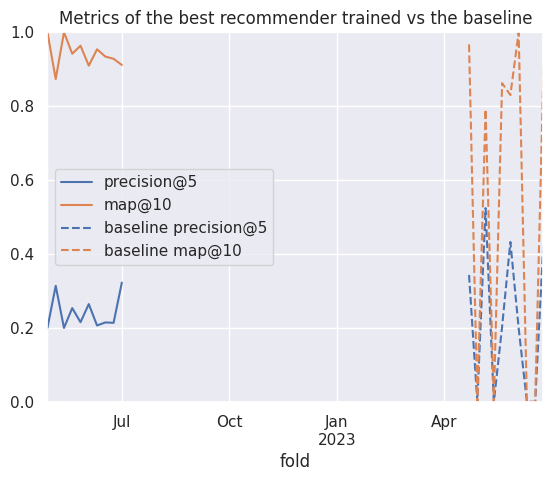

In [38]:
cols2plot = ['precision@5', 'map@10']

ax = best.reset_index().set_index('fold')[cols2plot].plot()
ax.set_ylim(0, 1)

bdf[cols2plot].rename(columns='baseline {}'.format).plot(ax=ax, style='--', color=[l.get_color() for l in ax.lines])

plt.title("Metrics of the best recommender trained vs the baseline")
best[cols2plot].describe()

In [39]:
best[['precision@5', 'ndcg@5', 'precision@10', 'ndcg@10', 'map@5', 'map@10']].mean()

precision@5     0.240569
ndcg@5          0.957780
precision@10    0.120284
ndcg@10         0.957780
map@5           0.941623
map@10          0.941623
dtype: float64

## Realisitc model (repeating hparams)

In [40]:
from pandas.api.types import is_float_dtype

config_cols = [ c for c in rdf.columns if c.startswith('config/') and c != 'config/iteration' ]
config_cols2 = config_cols + ['config/iteration']

all_configs = rdf.copy()
display(all_configs)
all_configs['config/fold'] = (pd.to_datetime(all_configs['config/fold']) + pd.tseries.frequencies.to_offset(SPLITS_FREQ)) # .astype(str)

# Leonardo Torres de Quevedo, perdoname por lo que voy a hacer
float_cols = [c for c in config_cols if is_float_dtype(all_configs[c].dtype) ]
all_configs[float_cols] = all_configs[float_cols].astype(str)
all_configs = all_configs.set_index(config_cols)
all_configs_index = all_configs.index

# all_configs_index = pd.MultiIndex.from_frame(all_configs[config_cols].astype(str))[:-1]

# No podemos utilizar los indices "tal cual" pues la coma flotante
# no encaja entre un fold y otro. Así que lo convierto a string
# y luego de nuevo a coma flotante.
# La otra solución sería usar np.isclose, pero habría que programar
# varias lineas y hacer nuestra propia función de búsqueda por cada
# columna o algo así
# O también, en lugar de str, multiplicar por 10^7 (el min. es 10**-7),
# pasar a entero, y luego dividir
aux = rdf.copy()
aux[float_cols] = aux[float_cols].astype(str)
aux = aux.set_index(config_cols)
print("Index intersection:", aux.index.intersection(all_configs_index))
all_realistic = aux.loc[aux.index.intersection(all_configs_index)]
# all_realistic.index = all_realistic.index.set_levels(
#     [ pd.to_numeric(l) for l in realistic.index.levels ]
# )
all_realistic

,real_batch_size,config/iteration,loss,mf_loss,emb_loss,precision@1,precision@3,precision@5,precision@10,precision@15,...,time_total_test,done,trial_id,config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,config/fold
0,600,5,0.539276,0.539275,3.353507e-07,1.000000,0.333333,0.200000,0.100000,0.066667,...,0.126738,False,699ef8b3,1024,8,4,0.0164,2.502810e-07,10YE,2022-05-04
1,600,10,0.278287,0.278286,1.207724e-06,1.000000,0.333333,0.200000,0.100000,0.066667,...,0.253702,False,699ef8b3,1024,8,4,0.0164,2.502810e-07,10YE,2022-05-04
2,600,15,0.156932,0.156930,2.277670e-06,1.000000,0.333333,0.200000,0.100000,0.066667,...,0.380949,False,699ef8b3,1024,8,4,0.0164,2.502810e-07,10YE,2022-05-04
3,600,20,0.120427,0.120424,3.085630e-06,1.000000,0.333333,0.200000,0.100000,0.066667,...,0.507663,False,699ef8b3,1024,8,4,0.0164,2.502810e-07,10YE,2022-05-04
4,600,25,0.114586,0.114582,3.738829e-06,1.000000,0.333333,0.200000,0.100000,0.066667,...,0.635388,False,699ef8b3,1024,8,4,0.0164,2.502810e-07,10YE,2022-05-04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35,1024,180,0.008933,0.008914,1.912410e-05,0.778378,0.537838,0.322703,0.161351,0.107568,...,6.642360,False,1cbf286a,1024,145,2,0.0014,5.526989e-07,10YE,2022-07-06
36,1024,185,0.007711,0.007691,1.946618e-05,0.778378,0.537838,0.322703,0.161351,0.107568,...,6.819627,False,1cbf286a,1024,145,2,0.0014,5.526989e-07,10YE,2022-07-06
37,1024,190,0.006984,0.006964,1.974478e-05,0.778378,0.537838,0.322703,0.161351,0.107568,...,7.002423,False,1cbf286a,1024,145,2,0.0014,5.526989e-07,10YE,2022-07-06
38,1024,195,0.007716,0.007696,1.998758e-05,0.781081,0.537838,0.322703,0.161351,0.107568,...,7.191747,False,1cbf286a,1024,145,2,0.0014,5.526989e-07,10YE,2022-07-06


Index intersection: MultiIndex([( 128,  74, 2,                '0.1736', ...),
            ( 512,  86, 3,                '0.0002', ...),
            ( 256, 219, 4,                 '0.095', ...),
            ( 512,  26, 2,                '0.6694', ...),
            ( 256,  27, 2,                '0.2056', ...),
            (1024, 364, 2,                '0.0002', ...),
            (  64, 694, 1,                '0.4148', ...),
            ( 256, 241, 2, '0.0017000000000000001', ...),
            ( 256,  96, 2,                '0.0784', ...),
            ( 512,   7, 4,                '0.1593', ...),
            ...
            (1024, 364, 2,                '0.0002', ...),
            ( 256,  32, 4,  '0.015000000000000001', ...),
            ( 256, 219, 4,                 '0.095', ...),
            (1024, 332, 3,                '0.4863', ...),
            ( 512,   7, 4,                '0.1593', ...),
            ( 512,   3, 2,                '0.0001', ...),
            (1024, 313, 2,          

real_batch_size  \
config/batch_size config/embedding_dim config/conv_layers config/learning_rate  config/l2             config/window_size config/fold                    
128               74                   2                  0.1736                8.637993900055015e-07 10YE               2022-05-11               128   
                                                                                                                         2022-05-11               128   
                                                                                                                         2022-05-11               128   
                                                                                                                         2022-05-11               128   
                                                                                                                         2022-05-11               128   
...                                                                                                                                               ...   
512               86                   2                  0.0006000000000000001 0.0013432538444605776 21d                2022-07-06               512   
                                                                                                                         2022-07-06               512   
                                                                                                                         2022-07-06               512   
                                                                                                                         2022-07-06               512   
                                                                                                                         2022-07-06               512   

                                                                                                                                      config/iteration  \
config/batch_size config/embedding_dim config/conv_layers config/learning_rate  config/l2             config/window_size config/fold                     
128               74                   2                  0.1736                8.637993900055015e-07 10YE               2022-05-11                  5   
                                                                                                                         2022-05-11                 10   
                                                                                                                         2022-05-11                 15   
                                                                                                                         2022-05-11                 20   
                                                                                                                         2022-05-11                 25   
...                                                                                                                                                ...   
512               86                   2                  0.0006000000000000001 0.0013432538444605776 21d                2022-07-06                180   
                                                                                                                         2022-07-06                185   
                                                                                                                         2022-07-06                190   
                                                                                                                         2022-07-06                195   
                                                                                                                         2022-07-06                200   

                                                                                                                                          los

In [41]:
def bestByFold(df):
    idx = df[OPTIM_METRIC].idxmax()
    return df.loc[idx]

best_configs = (
    all_configs.loc[all_configs.index.intersection(all_realistic.index)]
    .reset_index()
    .groupby("config/fold")
    .apply(bestByFold)
    .set_index(config_cols)
    # .rename(columns="best_{}".format)
)
best_configs

/tmp/ipykernel_130327/543710717.py:9: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



real_batch_size  \
config/batch_size config/embedding_dim config/conv_layers config/learning_rate config/l2              config/window_size config/fold                    
256               32                   4                  0.015000000000000001 1.242023640083893e-06  10YE               2022-05-11               256   
128               74                   2                  0.1736               8.637993900055015e-07  10YE               2022-05-18               128   
                  34                   2                  0.0091               0.0007608003684554223  60d                2022-05-25               128   
64                39                   3                  0.2341               0.0019458808162100595  10YE               2022-06-01                64   
1024              332                  3                  0.4863               0.0022115851672258576  10YE               2022-06-08               997   
                  962                  3                  0.049300000000000004 2.1579431828663343e-07 90d                2022-06-15               686   
512               665                  3                  0.0092               2.7445636362385535e-05 90d                2022-06-22               512   
256               219                  4                  0.095                0.0002612310958370494  60d                2022-06-29               256   
1024              313                  2                  0.0004               4.45925320981388e-07   10YE               2022-07-06              1024   

                                                                                                                                      config/iteration  \
config/batch_size config/embedding_dim config/conv_layers config/learning_rate config/l2              config/window_size config/fold                     
256               32                   4                  0.015000000000000001 1.242023640083893e-06  10YE               2022-05-11                  5   
128               74                   2                  0.1736               8.637993900055015e-07  10YE               2022-05-18                 90   
                  34                   2                  0.0091               0.0007608003684554223  60d                2022-05-25                  5   
64                39                   3                  0.2341               0.0019458808162100595  10YE               2022-06-01                 15   
1024              332                  3                  0.4863               0.0022115851672258576  10YE               2022-06-08                 55   
                  962                  3                  0.049300000000000004 2.1579431828663343e-07 90d                2022-06-15                 65   
512               665                  3                  0.0092               2.7445636362385535e-05 90d                2022-06-22                 10   
256               219                  4                  0.095                0.0002612310958370494  60d                2022-06-29                195   
1024              313                  2                  0.0004               4.45925320981388e-07   10YE               2022-07-06                130   

                                                                                                                                          loss  \
config/batch_size config/embedding_dim config/conv_layers config/learning_rate config/l2              config/window_size config/fold             
256               32                   4                  0.015000000000000001 1.242023640083893e-06  10YE               2022-05-11   0.143110   
128               74                   2                  0.1736               8.637993900055015e-07  10YE               2022-05-18   0.583387   
                  34                   2                  0.0091               0.0007608003684554223  60d                2022-05-25   0.166465   
64                39     

In [42]:
best_realistic = all_realistic.join(best_configs.rename(columns="best_{}".format), how='right')

# Display the configs, to see that nothing is missing
display(best_realistic.groupby(best_realistic.index).size())

# First, do the "early stopping" (keep only the ones that are the same iterations or less)
best_realistic = best_realistic[best_realistic['config/iteration'] <= best_realistic['best_config/iteration']]
# Now, lets keep just the one with the best iteration
best_realistic = (
    best_realistic.sort_values('config/iteration')
    .groupby('config/fold')
    .tail(1)
    .sort_index()
    .reset_index()
    .set_index('config/fold')
    .sort_index()
)
best_realistic

(64, 39, 3, 0.2341, 0.0019458808162100595, 10YE, 2022-06-01 00:00:00)                     40
(128, 34, 2, 0.0091, 0.0007608003684554223, 60d, 2022-05-25 00:00:00)                     40
(128, 74, 2, 0.1736, 8.637993900055015e-07, 10YE, 2022-05-18 00:00:00)                    40
(256, 32, 4, 0.015000000000000001, 1.242023640083893e-06, 10YE, 2022-05-11 00:00:00)      40
(256, 219, 4, 0.095, 0.0002612310958370494, 60d, 2022-06-29 00:00:00)                     40
(512, 665, 3, 0.0092, 2.7445636362385535e-05, 90d, 2022-06-22 00:00:00)                   40
(1024, 313, 2, 0.0004, 4.45925320981388e-07, 10YE, 2022-07-06 00:00:00)                   40
(1024, 332, 3, 0.4863, 0.0022115851672258576, 10YE, 2022-06-08 00:00:00)                  40
(1024, 962, 3, 0.049300000000000004, 2.1579431828663343e-07, 90d, 2022-06-15 00:00:00)    40
dtype: int64

,config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,real_batch_size,config/iteration,loss,mf_loss,...,best_r-precision@3,best_r-precision@5,best_r-precision@10,best_r-precision@15,best_r-precision@100,best_time_rec,best_time_total_train,best_time_total_test,best_done,best_trial_id
config/fold,,,,,,,,,,,,,,,,,,,,,
2022-05-11,256,32,4,0.015000000000000001,1.242023640083893e-06,10YE,256,5,0.133965,0.133950,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.021460,0.209414,0.126242,False,a20d5f6d
2022-05-18,128,74,2,0.1736,8.637993900055015e-07,10YE,128,90,0.009881,0.005591,...,0.955729,0.963542,0.963542,0.963542,0.963542,0.002907,2.514961,2.505267,False,75c0928f
2022-05-25,128,34,2,0.0091,0.0007608003684554223,60d,128,5,0.128721,0.119125,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.020928,0.244853,0.132619,False,660e3d5b
2022-06-01,64,39,3,0.2341,0.0019458808162100595,10YE,64,15,0.786851,0.271060,...,0.949153,0.949153,0.949153,0.949153,0.949153,0.004822,1.513560,0.488275,False,103ca7ef
2022-06-08,1024,332,3,0.4863,0.0022115851672258576,10YE,1024,55,1.824905,0.422741,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.003778,0.901181,1.592946,False,5c83c09c
2022-06-15,1024,962,3,0.049300000000000004,2.1579431828663343e-07,90d,721,65,0.019481,0.019299,...,0.982000,0.982000,0.982000,0.982000,0.982000,0.001861,0.852561,1.942511,False,1d7c4969
2022-06-22,512,665,3,0.0092,2.7445636362385535e-05,90d,512,10,0.023430,0.021925,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.001924,0.284368,0.284069,False,f5bf0a28
2022-06-29,256,219,4,0.095,0.0002612310958370494,60d,256,195,0.032756,0.005341,...,0.984694,0.984694,0.984694,0.984694,0.984694,0.002177,3.516167,5.759723,False,bbda3761
2022-07-06,1024,313,2,0.0004,4.45925320981388e-07,10YE,1024,130,0.040588,0.040580,...,0.986702,0.986702,0.986702,0.986702,0.986702,0.002420,1.924906,3.782999,False,650f77e2


In [43]:
paths.save_model_results(
    clean_results(best_realistic.reset_index().copy())[0],
    'lightgcn-best-test',
    ORG_NAME,
    SPLITS_FREQ,
    SPLITS_NORMALIZE,
    K_RECOMMENDATIONS,
)

Saved dataframe into /home/daviddavo/recsys4daos/data/output/Lido/models/lightgcn-best-test_W-WED_normalize.parquet


,precision@5,map@10
count,9.000000,9.000000
mean,0.245076,0.825604
std,0.046759,0.110242
min,0.200000,0.598159
25%,0.213825,0.785978
50%,0.215534,0.834869
75%,0.264495,0.878641
max,0.322703,1.000000


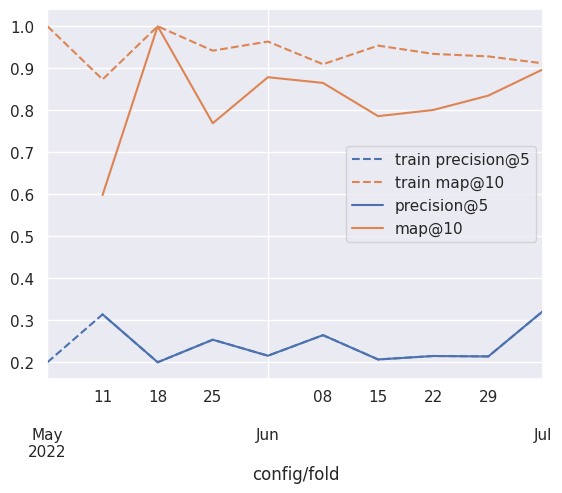

In [44]:
_toplot = best_realistic.copy().sort_index()
_toplot.index = pd.to_datetime(_toplot.index)

ax = best.reset_index().set_index('fold')[cols2plot].rename(columns='train {}'.format).plot(style='--', color=[l.get_color() for l in ax.lines])
# plt.xticks(range(10))
# bdf[cols2plot].rename(columns='baseline {}'.format).reset_index(drop=True).plot(ax=ax, style=':', color=[l.get_color() for l in ax.lines])

_toplot[cols2plot].plot(ax=ax)
# ax.set_ylim(0, 1)

_toplot[cols2plot].describe()

In [45]:
best_realistic.index.min()

Timestamp('2022-05-11 00:00:00')

In [46]:
bdf

,precision@1,precision@3,precision@5,precision@10,precision@15,precision@100,ndcg@1,ndcg@3,ndcg@5,ndcg@10,...,recall@10,recall@15,recall@100,r-precision@1,r-precision@3,r-precision@5,r-precision@10,r-precision@15,r-precision@100,time_eval
fold,,,,,,,,,,,,,,,,,,,,,
2023-04-26,0.934109,0.572351,0.343411,0.171705,0.114470,0.017171,0.934109,0.975681,0.975681,0.975681,...,1.0,1.0,1.0,0.616183,1.000000,1.000000,1.000000,1.000000,1.000000,0.154398
2023-05-03,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.069176
2023-05-10,0.719212,0.623974,0.524138,0.262069,0.174713,0.026207,0.719212,0.735321,0.851931,0.851931,...,1.0,1.0,1.0,0.387557,0.750534,0.867521,0.867521,0.867521,0.867521,0.158622
2023-05-17,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.069967
2023-05-24,0.724382,0.339223,0.203534,0.101767,0.067845,0.010177,0.724382,0.898277,0.898277,0.898277,...,1.0,1.0,1.0,0.987805,1.000000,1.000000,1.000000,1.000000,1.000000,0.155763
2023-05-31,0.757895,0.624561,0.432632,0.216316,0.144211,0.021632,0.757895,0.799728,0.874486,0.874486,...,1.0,1.0,1.0,0.504051,0.926239,0.954955,0.954955,0.954955,0.954955,0.154062
2023-06-07,1.000000,0.333333,0.200000,0.100000,0.066667,0.010000,1.000000,1.000000,1.000000,1.000000,...,1.0,1.0,1.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.122659
2023-06-14,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.069231
2023-06-21,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.070196


In [47]:
_PERFECT_NAME = 'Ground Truth'
_LEAK_NAME = 'Leaky GNN'
CAT_ORDER = [_PERFECT_NAME, _LEAK_NAME, 'GNN', 'OpenPop']

def _get_toplot_table(metrics2plot=cols2plot, oracle=True, perfect=None, common_only=False):
    if perfect is None:
        perfect = metrics2plot
    
    # _toplot = best_realistic.copy()
    # _toplot.index = pd.to_numeric(_toplot.index)
    # _toplot['fold'] = _toplot.index

    _first_real_fold_idx = best_realistic.index.min()
    
    _toplot_real = best_realistic[metrics2plot].copy()
    _toplot_real['fold'] = pd.to_datetime(_toplot_real.index) # .astype(int)
    _toplot_real['rec'] = 'GNN'

    _toplot_base = bdf[metrics2plot].copy()
    # fold2str = _toplot_base.index.strftime('%G-W%V')
    # _toplot_base['fold'] = range(len(_toplot_base))
    _toplot_base['fold'] = pd.to_datetime(_toplot_base.index)
    _toplot_base['rec'] = 'OpenPop'

    # _colsbest = map("best_{}".format, _cols)
    if oracle:
        _toplot_best = best.reset_index().set_index('fold')[metrics2plot].copy() # [_colsbest].rename(columns=lambda x: x.split("_", 1)[-1])
        _toplot_best['fold'] = _toplot_best.index
        _toplot_best['rec'] = _LEAK_NAME
    else:
        _toplot_best = None
        _toplot_base = _toplot_base[_toplot_base['fold'] >= _first_real_fold_idx]
        _toplot_real = _toplot_real[_toplot_real['fold'] >= _first_real_fold_idx]

    if perfect:
        _toplot_perfect = pdf[perfect].copy()
        _toplot_perfect['fold'] = pd.to_datetime(_toplot_perfect.index)
        _toplot_perfect['rec'] = _PERFECT_NAME
        # Make same len as baseline
        # _toplot_perfect = _toplot_perfect.iloc[-len(_toplot_base):]
        _toplot_perfect = _toplot_perfect.loc[_toplot_base.index]
        assert _toplot_perfect.index.equals(_toplot_base.index)
    else:
        _toplot_perfect = None
        
    _toplot = (
        pd.concat((
            _toplot_real, 
            _toplot_best,
            _toplot_base,
            _toplot_perfect,
        ), ignore_index=True)
        .melt(id_vars=['fold', 'rec'], value_vars=metrics2plot, var_name='metric')
    )

    assert pd.api.types.is_datetime64_any_dtype(_toplot['fold'].dtype), "Fold column should be datetime"
    assert not (_toplot['fold'].isna()).any()
    
    _toplot['rec'] = pd.Categorical(_toplot['rec'], CAT_ORDER)
    _toplot['fold_week'] = _toplot['fold'].dt.strftime('%G-W%V') # fold2str[_toplot['fold']]

    return _toplot.sort_values('fold')

_tablecols = ['precision@5', 'precision@10', 'recall@5', 'recall@10', 'map@5', 'map@10', 'ndcg@5', 'ndcg@10']
_table = _get_toplot_table(_tablecols)
# Skip the first fold so everyone has 9 folds and metrics are consistent
_table = _table[_table['fold'] >= best_realistic.index.min()]
print(_table.groupby(['rec', 'metric'])['value'].mean().unstack(level=-1)[_tablecols].rename(
    index={
        'Perfect': 'Ground Truth',
        'realistic': 'GNN'
    }
).style.format(precision=2).to_latex())
_table.groupby(['rec', 'metric']).describe()

\begin{tabular}{lrrrrrrrr}
metric & precision@5 & precision@10 & recall@5 & recall@10 & map@5 & map@10 & ndcg@5 & ndcg@10 \\
rec &  &  &  &  &  &  &  &  \\
Ground Truth & 0.21 & 0.11 & 0.60 & 0.60 & 0.60 & 0.60 & 0.60 & 0.60 \\
Leaky GNN & 0.25 & 0.12 & 1.00 & 1.00 & 0.94 & 0.94 & 0.95 & 0.95 \\
GNN & 0.25 & 0.12 & 1.00 & 1.00 & 0.83 & 0.83 & 0.87 & 0.87 \\
OpenPop & 0.21 & 0.11 & 0.60 & 0.60 & 0.54 & 0.54 & 0.55 & 0.55 \\
\end{tabular}



/tmp/ipykernel_130327/3868849439.py:68: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/tmp/ipykernel_130327/3868849439.py:74: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



fold                                            \
                          count                 mean                  min   
rec          metric                                                         
Ground Truth map@10          10  2023-05-27 12:00:00  2023-04-26 00:00:00   
             map@5           10  2023-05-27 12:00:00  2023-04-26 00:00:00   
             ndcg@10         10  2023-05-27 12:00:00  2023-04-26 00:00:00   
             ndcg@5          10  2023-05-27 12:00:00  2023-04-26 00:00:00   
             precision@10    10  2023-05-27 12:00:00  2023-04-26 00:00:00   
             precision@5     10  2023-05-27 12:00:00  2023-04-26 00:00:00   
             recall@10       10  2023-05-27 12:00:00  2023-04-26 00:00:00   
             recall@5        10  2023-05-27 12:00:00  2023-04-26 00:00:00   
Leaky GNN    map@10           9  2022-06-08 00:00:00  2022-05-11 00:00:00   
             map@5            9  2022-06-08 00:00:00  2022-05-11 00:00:00   
             ndcg@10          9  2022-06-08 00:00:00  2022-05-11 00:00:00   
             ndcg@5           9  2022-06-08 00:00:00  2022-05-11 00:00:00   
             precision@10     9  2022-06-08 00:00:00  2022-05-11 00:00:00   
             precision@5      9  2022-06-08 00:00:00  2022-05-11 00:00:00   
             recall@10        9  2022-06-08 00:00:00  2022-05-11 00:00:00   
             recall@5         9  2022-06-08 00:00:00  2022-05-11 00:00:00   
GNN          map@10           9  2022-06-08 00:00:00  2022-05-11 00:00:00   
             map@5            9  2022-06-08 00:00:00  2022-05-11 00:00:00   
             ndcg@10          9  2022-06-08 00:00:00  2022-05-11 00:00:00   
             ndcg@5           9  2022-06-08 00:00:00  2022-05-11 00:00:00   
             precision@10     9  2022-06-08 00:00:00  2022-05-11 00:00:00   
             precision@5      9  2022-06-08 00:00:00  2022-05-11 00:00:00   
             recall@10        9  2022-06-08 00:00:00  2022-05-11 00:00:00   
             recall@5         9  2022-06-08 00:00:00  2022-05-11 00:00:00   
OpenPop      map@10          10  2023-05-27 12:00:00  2023-04-26 00:00:00   
             map@5           10  2023-05-27 12:00:00  2023-04-26 00:00:00   
             ndcg@10         10  2023-05-27 12:00:00  2023-04-26 00:00:00   
             ndcg@5          10  2023-05-27 12:00:00  2023-04-26 00:00:00   
             precision@10    10  2023-05-27 12:00:00  2023-04-26 00:00:00   
             precision@5     10  2023-05-27 12:00:00  2023-04-26 00:00:00   
             recall@10       10  2023-05-27 12:00:00  2023-04-26 00:00:00   
             recall@5        10  2023-05-27 12:00:00  2023-04-26 00:00:00   

                                                                     \
                                           25%                  50%   
rec          metric                                                   
Ground Truth map@10        2023-05-11 18:00:00  2023-05-27 12:00:00   
             map@5         2023-05-11 18:00:00  2023-05-27 12:00:00   
             ndcg@10       2023-05-11 18:00:00  2023-05-27 12:00:00   
             ndcg@5        2023-05-11 18:00:00  2023-05-27 12:00:00   
             precision@10  2023-05-11 18:00:00  2023-05-27 12:00:00   
             precision@5   2023-05-11 18:00:00  2023-05-27 12:00:00   
             recall@10     2023-05-11 18:00:00  2023-05-27 12:00:00   
             recall@5      2023-05-11 18:00:00  2023-05-27 12:00:00   
Leaky GNN    map@10        2022-05-25 00:00:00  2022-06-08 00:00:00   
             map@5         2022-05-25 00:00:00  2022-06-08 00:00:00   
             ndcg@10       2022-05-25 00:00:00  2022-06-08 00:00:00   
             ndcg@5        2022-05-25 00:00:00  2022-06-08 00:00:00   
             precision@10  2022-05-25 00:00:00  2022-06-08 00:00:00   
             precision@5   2022-05-25 00:00:00  2022-06-08 00:00:00   
             recall@10     2022-05-25 00:00:00  2022-06-08 00:00:00   
             recall@5      2022-05-25 00:00:00  2022-

/tmp/ipykernel_130327/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_130327/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



count      mean       std       min       25%  \
rec          metric                                                       
Ground Truth map@10        10.0  0.600000  0.516398  0.000000  0.000000   
             precision@5   10.0  0.213590  0.208653  0.000000  0.000000   
Leaky GNN    map@10        10.0  0.941623  0.039824  0.873385  0.915662   
             precision@5   10.0  0.240569  0.046332  0.200000  0.208438   
GNN          map@10         9.0  0.825604  0.110242  0.598159  0.785978   
             precision@5    9.0  0.245076  0.046759  0.200000  0.213825   
OpenPop      map@10        10.0  0.535189  0.464493  0.000000  0.000000   
             precision@5   10.0  0.213590  0.208653  0.000000  0.000000   

                               50%       75%       max  
rec          metric                                     
Ground Truth map@10       1.000000  1.000000  1.000000  
             precision@5  0.201767  0.409991  0.524138  
Leaky GNN    map@10       0.938049  0.961163  1.000000  
             precision@5  0.215205  0.261786  0.322703  
GNN          map@10       0.834869  0.878641  1.000000  
             precision@5  0.215534  0.264495  0.322703  
OpenPop      map@10       0.810652  0.891553  1.000000  
             precision@5  0.201767  0.409991  0.524138

Cannot show ipywidgets in text

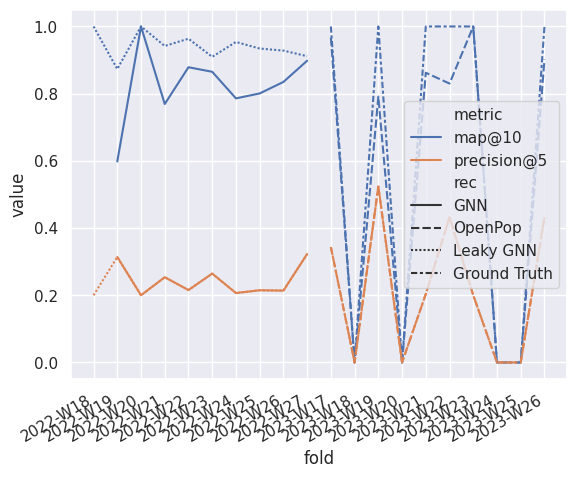

In [48]:
def plot_gnn_results(metrics2plot=cols2plot, oracle=False, perfect=None, common_only=False):
    _toplot = _get_toplot_table(metrics2plot, oracle, perfect)

    if common_only:
        _toplot = _toplot[_toplot['fold'] >= best_realistic.index.min()]

    ax = sns.lineplot(
        _toplot, x='fold_week', y='value', 
        hue='metric' if len(metrics2plot) > 1 else None, 
        style='rec',
        style_order=['GNN', 'OpenPop', _LEAK_NAME, _PERFECT_NAME],
    )
    ax.set_xlabel('fold')
    
    if len(metrics2plot) == 1:
        ax.set_ylabel(metrics2plot[0])
        ax.legend_.set_title(None)

    # ax.set_xticks(ax.get_xticks()[1:-1], _toplot_base.index.strftime('%G-W%V'), rotation=30, ha='right')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right')

    display(_toplot.groupby(['rec', 'metric'])['value'].describe())
    # print(_toplot.groupby(['rec', 'metric'])['value'].describe()[['mean', 'std', '50%', 'min', 'max']].to_html())

    return ax

ax = plot_gnn_results(oracle=True) # perfect=['precision@5'])
download_matplotlib(ax.figure, '09_gnn_results.pdf')

/tmp/ipykernel_130327/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_130327/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,,count,mean,std,min,25%,50%,75%,max
rec,metric,,,,,,,,
Ground Truth,precision@5,10.0,0.213590,0.208653,0.0,0.000000,0.201767,0.409991,0.524138
GNN,precision@5,9.0,0.245076,0.046759,0.2,0.213825,0.215534,0.264495,0.322703
OpenPop,precision@5,10.0,0.213590,0.208653,0.0,0.000000,0.201767,0.409991,0.524138


Cannot show ipywidgets in text

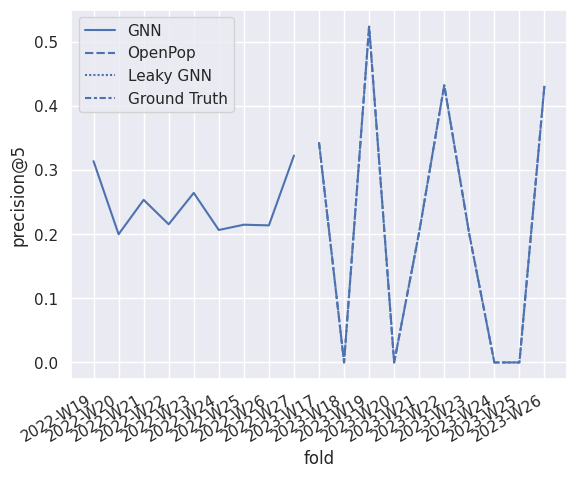

In [49]:
ax = plot_gnn_results(['precision@5'])
ax.figure.savefig('../figures/09_gnn_results_precision_5.png', bbox_inches='tight')
download_matplotlib(ax.figure, '09_gnn_results_precision_5.pdf')

/tmp/ipykernel_130327/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_130327/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,,count,mean,std,min,25%,50%,75%,max
rec,metric,,,,,,,,
Ground Truth,precision@5,10.0,0.213590,0.208653,0.0,0.000000,0.201767,0.409991,0.524138
Leaky GNN,precision@5,9.0,0.245076,0.046759,0.2,0.213825,0.215534,0.264495,0.322703
GNN,precision@5,9.0,0.245076,0.046759,0.2,0.213825,0.215534,0.264495,0.322703
OpenPop,precision@5,10.0,0.213590,0.208653,0.0,0.000000,0.201767,0.409991,0.524138


Cannot show ipywidgets in text

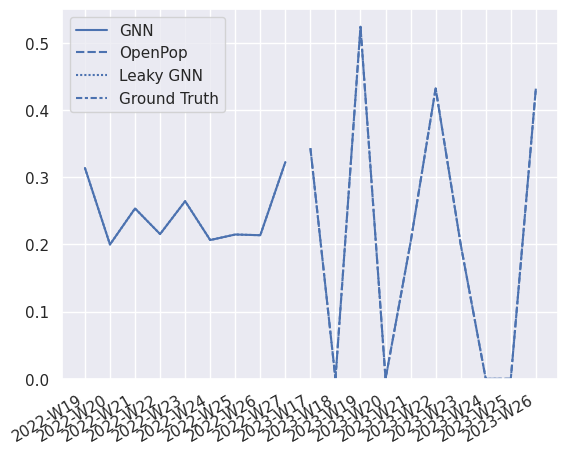

In [50]:
ax = plot_gnn_results(['precision@5'], oracle=True, common_only=True)

ax.set_xlabel('')
ax.set_ylabel('')
ax.set_ylim(0)

download_matplotlib(ax.figure, '09_gnn_results_precision_5_leaky.pdf')

/tmp/ipykernel_130327/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_130327/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,,count,mean,std,min,25%,50%,75%,max
rec,metric,,,,,,,,
Ground Truth,map@10,10.0,0.600000,0.516398,0.000000,0.000000,1.000000,1.000000,1.0
GNN,map@10,9.0,0.825604,0.110242,0.598159,0.785978,0.834869,0.878641,1.0
OpenPop,map@10,10.0,0.535189,0.464493,0.000000,0.000000,0.810652,0.891553,1.0


Cannot show ipywidgets in text

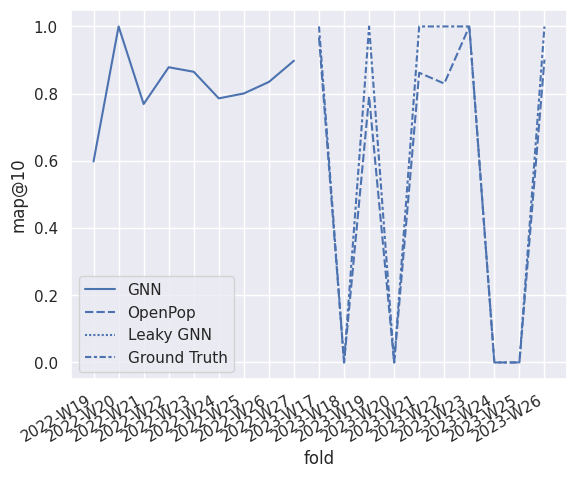

In [51]:
ax = plot_gnn_results(['map@10']) #, perfect=False)
ax.figure.savefig('../figures/09_gnn_results_map_10.png', bbox_inches='tight')
download_matplotlib(ax.figure, '09_gnn_results_map_10.pdf')

/tmp/ipykernel_130327/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_130327/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,,count,mean,std,min,25%,50%,75%,max
rec,metric,,,,,,,,
Ground Truth,ndcg@10,10.0,0.600000,0.516398,0.000000,0.000000,1.000000,1.000000,1.0
GNN,ndcg@10,9.0,0.871222,0.082120,0.700601,0.842022,0.878164,0.910420,1.0
OpenPop,ndcg@10,10.0,0.552724,0.477657,0.000000,0.000000,0.863208,0.919715,1.0


Cannot show ipywidgets in text

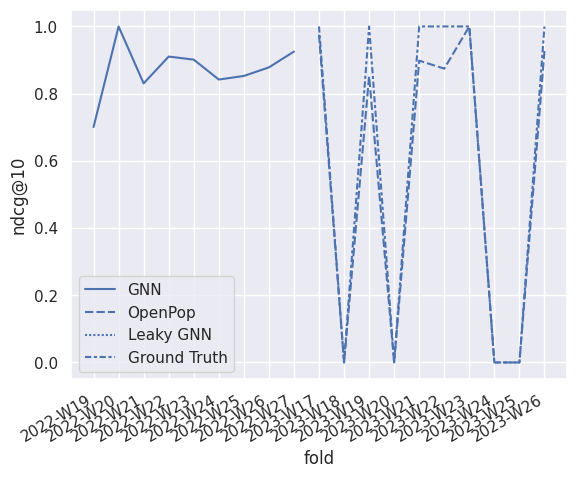

In [52]:
ax = plot_gnn_results(['ndcg@10']) #, perfect=False)
ax.figure.savefig('../figures/09_gnn_results_ndcg_10.png', bbox_inches='tight')
download_matplotlib(ax.figure, '09_gnn_results_ndcg_10.pdf')

/tmp/ipykernel_130327/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_130327/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,,count,mean,std,min,25%,50%,75%,max
rec,metric,,,,,,,,
Ground Truth,ndcg@10,10.0,0.600000,0.516398,0.000000,0.000000,1.000000,1.000000,1.0
Leaky GNN,ndcg@10,9.0,0.953089,0.026003,0.909849,0.935994,0.951333,0.965953,1.0
GNN,ndcg@10,9.0,0.871222,0.082120,0.700601,0.842022,0.878164,0.910420,1.0
OpenPop,ndcg@10,10.0,0.552724,0.477657,0.000000,0.000000,0.863208,0.919715,1.0


Cannot show ipywidgets in text

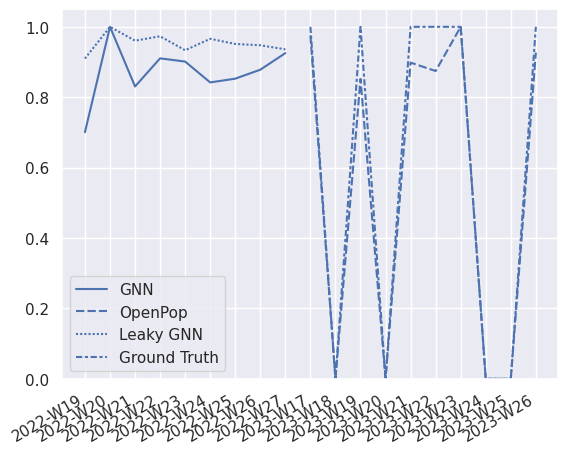

In [53]:
ax = plot_gnn_results(['ndcg@10'], oracle=True, common_only=True)

ax.set_xlabel('')
ax.set_ylabel('')
ax.set_ylim(0)

download_matplotlib(ax.figure, '09_gnn_results_ndcg_10_leaky.pdf')